In [1]:
import kagglehub
path = kagglehub.dataset_download("mahmudulhasantasin/fracatlas-original-dataset")
print("Path to dataset files:", path)

100%|██████████| 323M/323M [00:06<00:00, 49.2MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mahmudulhasantasin/fracatlas-original-dataset/versions/1


In [2]:
!ls -l /root/.cache/kagglehub/datasets/mahmudulhasantasin/fracatlas-original-dataset/versions/1/FracAtlas

total 172
drwxr-xr-x 6 root root   4096 Feb  1 18:08 Annotations
-rw-r--r-- 1 root root 163426 Feb  1 18:08 dataset.csv
drwxr-xr-x 4 root root   4096 Feb  1 18:08 images
drwxr-xr-x 3 root root   4096 Feb  1 18:08 Utilities


In [47]:
root = "/root/.cache/kagglehub/datasets/mahmudulhasantasin/fracatlas-original-dataset/versions/1/FracAtlas/"

In [48]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import pandas as pd
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

In [49]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [50]:
df = pd.read_csv(root + 'dataset.csv')

In [51]:
df.head()

,image_id,hand,leg,hip,shoulder,mixed,hardware,multiscan,fractured,fracture_count,frontal,lateral,oblique
0,IMG0000000.jpg,0,1,0,0,0,0,1,0,0,1,1,0
1,IMG0000001.jpg,0,1,0,0,0,0,1,0,0,1,1,0
2,IMG0000002.jpg,0,1,0,0,0,0,1,0,0,1,1,0
3,IMG0000003.jpg,0,1,0,0,0,0,1,0,0,0,1,1
4,IMG0000004.jpg,0,1,0,0,0,0,1,0,0,0,1,1


In [7]:
class ImageDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        """
        Args:
            csv_file (str): Path to the CSV file.
            transform (callable, optional): Optional transforms to be applied on an image.
        """
        self.data = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]

        if row['fractured'] == 1:
            img_path = root + "/images/Fractured/" + row['image_id']
        else:
            img_path = root + "images/Non_fractured/" + row['image_id']
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        label = int(row['fractured'])

        return image, label

In [20]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


In [21]:
csv_file = root + 'dataset.csv'
dataset = ImageDataset(csv_file, transform=transform)
data_loader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=4)


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [22]:

resnet = models.resnet50(pretrained=True)

num_features = resnet.fc.in_features
resnet.fc = nn.Linear(num_features, 2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = resnet.to(device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 180MB/s]


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet.parameters(), lr=1e-4)

In [ ]:
from tqdm import tqdm

num_epochs = 5

resnet.train()

for epoch in range(num_epochs):
    running_loss = 0.0
    loop = tqdm(data_loader, total=len(data_loader), desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for images, labels in loop:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = resnet(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_loss = running_loss / len(data_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")


Epoch [1/5]: 100%|██████████| 128/128 [00:59<00:00,  2.14it/s, loss=0.216]


Epoch [1/5], Loss: 0.3173


Epoch [2/5]: 100%|██████████| 128/128 [00:59<00:00,  2.15it/s, loss=0.34]


Epoch [2/5], Loss: 0.1910


Epoch [3/5]: 100%|██████████| 128/128 [00:55<00:00,  2.29it/s, loss=0.22]


Epoch [3/5], Loss: 0.1201


Epoch [4/5]: 100%|██████████| 128/128 [00:56<00:00,  2.29it/s, loss=0.059]


Epoch [4/5], Loss: 0.0871


Epoch [5/5]: 100%|██████████| 128/128 [00:58<00:00,  2.21it/s, loss=0.0144]

Epoch [5/5], Loss: 0.0714


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

data_dir = "/root/.cache/kagglehub/datasets/mahmudulhasantasin/fracatlas-original-dataset/versions/1/FracAtlas/images"
dataset = datasets.ImageFolder(root=data_dir, transform=transform)

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
resnet = models.resnet50(pretrained=True)

num_features = resnet.fc.in_features
resnet.fc = nn.Linear(num_features, 2)
resnet = resnet.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

In [29]:
criterion = FocalLoss()
optimizer = optim.Adam(resnet.parameters(), lr=1e-4)

In [ ]:
num_epochs = 5
resnet.train()

for epoch in range(num_epochs):
    running_loss = 0.0
    loop = tqdm(train_loader, total=len(train_loader), desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = resnet(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

Epoch [1/5]: 100%|██████████| 103/103 [00:54<00:00,  1.91it/s, loss=0.00462]


Epoch [1/5], Loss: 0.0224


Epoch [2/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.00216]


Epoch [2/5], Loss: 0.0137


Epoch [3/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.0324]


Epoch [3/5], Loss: 0.0095


Epoch [4/5]: 100%|██████████| 103/103 [00:46<00:00,  2.21it/s, loss=0.141]


Epoch [4/5], Loss: 0.0092


Epoch [5/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.0194]

Epoch [5/5], Loss: 0.0126


In [ ]:
def evaluate_model(model, dataloader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate evaluation metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    conf_matrix = confusion_matrix(all_labels, all_preds)

    print(f"Validation Accuracy: {accuracy:.4f}")
    print(f"Validation Precision: {precision:.4f}")
    print(f"Validation Recall: {recall:.4f}")
    print(f"Validation F1-Score: {f1:.4f}")
    print("Confusion Matrix:")
    print(conf_matrix)

# Run evaluation
evaluate_model(model, val_loader)

Validation Accuracy: 0.9192
Validation Precision: 0.9325
Validation Recall: 0.9695
Validation F1-Score: 0.9506
Confusion Matrix:
[[116  46]
 [ 20 635]]


In [ ]:
num_epochs = 5
resnet.train()

for epoch in range(num_epochs):
    running_loss = 0.0
    half_epoch = len(train_loader) // 2

    loop = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for batch_idx, (images, labels) in loop:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = resnet(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Print loss at half-epoch
        if batch_idx == half_epoch:
            avg_loss_half = running_loss / (batch_idx + 1)
            print(f"\nHalf-Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss_half:.4f}")

        # Update progress bar with loss
        loop.set_postfix(loss=loss.item())

    avg_loss = running_loss / len(train_loader)
    print(f"\nEpoch [{epoch+1}/{num_epochs}], Training Loss: {avg_loss:.4f}")

    # Run validation and print metrics after each epoch
    evaluate_model(resnet, val_loader)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Epoch [1/5]:  50%|█████     | 52/103 [00:24<00:20,  2.47it/s, loss=0.0275]


Half-Epoch [1/5], Loss: 0.0264


Epoch [1/5]: 100%|██████████| 103/103 [00:49<00:00,  2.09it/s, loss=0.00826]


Epoch [1/5], Training Loss: 0.0237


Validation Accuracy: 0.8654
Validation Precision: 0.8876
Validation Recall: 0.9527
Validation F1-Score: 0.9190
Confusion Matrix:
[[ 83  79]
 [ 31 624]]


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Epoch [2/5]:  50%|█████     | 52/103 [00:24<00:19,  2.61it/s, loss=0.0151]


Half-Epoch [2/5], Loss: 0.0260


Epoch [2/5]: 100%|██████████| 103/103 [00:46<00:00,  2.20it/s, loss=0.00518]


Epoch [2/5], Training Loss: 0.0247


Validation Accuracy: 0.8800
Validation Precision: 0.8873
Validation Recall: 0.9740
Validation F1-Score: 0.9287
Confusion Matrix:
[[ 81  81]
 [ 17 638]]


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Epoch [3/5]:  50%|█████     | 52/103 [00:25<00:34,  1.50it/s, loss=0.0196]


Half-Epoch [3/5], Loss: 0.0185


Epoch [3/5]: 100%|██████████| 103/103 [00:47<00:00,  2.17it/s, loss=0.0067]


Epoch [3/5], Training Loss: 0.0183


Validation Accuracy: 0.8825
Validation Precision: 0.9203
Validation Recall: 0.9344
Validation F1-Score: 0.9273
Confusion Matrix:
[[109  53]
 [ 43 612]]


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Epoch [4/5]:  50%|█████     | 52/103 [00:23<00:18,  2.77it/s, loss=0.0188]


Half-Epoch [4/5], Loss: 0.0131


Epoch [4/5]: 100%|██████████| 103/103 [00:45<00:00,  2.28it/s, loss=0.00443]



Epoch [4/5], Training Loss: 0.0144
Validation Accuracy: 0.9094
Validation Precision: 0.9144
Validation Recall: 0.9786
Validation F1-Score: 0.9454
Confusion Matrix:
[[102  60]
 [ 14 641]]


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Epoch [5/5]:  50%|█████     | 52/103 [00:25<00:25,  1.97it/s, loss=0.00773]


Half-Epoch [5/5], Loss: 0.0117


Epoch [5/5]: 100%|██████████| 103/103 [00:47<00:00,  2.19it/s, loss=0.000138]


Epoch [5/5], Training Loss: 0.0124


Validation Accuracy: 0.8421
Validation Precision: 0.8355
Validation Recall: 1.0000
Validation F1-Score: 0.9104
Confusion Matrix:
[[ 33 129]
 [  0 655]]


# Classification Report:  
## Dataset:
The dataset consists of images stored in a structured directory format. The images are categorized into:
- Fractured images  
- Non-fractured images  
The dataset is split into training and validation sets with an 80-20 split ratio.

## Architecture:
The model is based on ResNet-50. The final fully connected layer is modified to output two classes.
- Backbone Model: ResNet-50 (Pretrained)
- Final Layer: Linear layer with two output nodes for classification
- Loss Function: Focal Loss (to address class imbalance)
- Optimizer: Adam (learning rate: 1e-4)
- Batch Size: 32
- Number of Epochs: 5

## Training:
initially for demonstration purposes we only trained the train data with cross entropy loss and focal loss which we defined ourselves to compare the result of these two loss function, since the dataset is imbalanced we expected that the focal loss would perform better bbecause it gives higher weight to the class containing the less number of samples.  

#### output of cross entropy:  
Epoch [1/5]: 100%|██████████| 128/128 [00:59<00:00,  2.14it/s, loss=0.216]
Epoch [1/5], Loss: 0.3173

Epoch [2/5]: 100%|██████████| 128/128 [00:59<00:00,  2.15it/s, loss=0.34]
Epoch [2/5], Loss: 0.1910

Epoch [3/5]: 100%|██████████| 128/128 [00:55<00:00,  2.29it/s, loss=0.22]
Epoch [3/5], Loss: 0.1201

Epoch [4/5]: 100%|██████████| 128/128 [00:56<00:00,  2.29it/s, loss=0.059]
Epoch [4/5], Loss: 0.0871

Epoch [5/5]: 100%|██████████| 128/128 [00:58<00:00,  2.21it/s, loss=0.0144]  Epoch [5/5], Loss: 0.0714  

#### output of focal loss:  
Epoch [1/5]: 100%|██████████| 103/103 [00:54<00:00,  1.91it/s, loss=0.00462]
Epoch [1/5], Loss: 0.0224

Epoch [2/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.00216]
Epoch [2/5], Loss: 0.0137

Epoch [3/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.0324]
Epoch [3/5], Loss: 0.0095

Epoch [4/5]: 100%|██████████| 103/103 [00:46<00:00,  2.21it/s, loss=0.141]
Epoch [4/5], Loss: 0.0092

Epoch [5/5]: 100%|██████████| 103/103 [00:46<00:00,  2.23it/s, loss=0.0194]Epoch [5/5], Loss: 0.0126

as expected focal loss had alot lower range.

## Conclusion
apart from the experiment with the loss function, we further splitted the dataset into train and validation and evaluated the mode using the mentioned metrics. the loss noticably dropped after 5 epochs and according to the confusion matrix we had no false positive samples and a few false negatives which makes sense because a bigger portion of the data were negative samples. generally we can state that the model successfully learned to differentiate between fractured and non-fractured images with an average validation accuracy of around 88-90%. However, a decrease in accuracy in the last epoch suggests potential overfitting or variations in data.



# **Segmentation**

In [9]:
!pip install segment_anything

In [56]:
import os
import json
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools.coco import COCO
from segment_anything import sam_model_registry, SamPredictor
from torchvision.transforms import functional as TF
from skimage.measure import label
from sklearn.metrics import precision_score, recall_score

In [63]:
coco_json_path = root + "Annotations/COCO JSON/COCO_fracture_masks.json"
image_folder = root + "images/"
fractured_folder = os.path.join(image_folder, "Fractured/")
non_fractured_folder = os.path.join(image_folder, "Non_fractured/")

In [58]:
coco = COCO(coco_json_path)
img_ids = coco.getImgIds()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [59]:
metrics = {'iou': [], 'precision': [], 'recall': []}

In [60]:
sam_checkpoint = "sam_vit_h_4b8939.pth"
torch.hub.download_url_to_file("https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth", sam_checkpoint)
sam = sam_model_registry["vit_h"](checkpoint=sam_checkpoint).to(device)
predictor = SamPredictor(sam)

100%|██████████| 2.39G/2.39G [01:33<00:00, 27.5MB/s]
/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
 

In [65]:
sample_ids = np.random.choice(img_ids, 5, replace=False)

# Function to compute IoU
def compute_iou(mask_gt, mask_pred):
    intersection = np.logical_and(mask_gt, mask_pred).sum()
    union = np.logical_or(mask_gt, mask_pred).sum()
    return intersection / union if union > 0 else 0

# Process each image
for img_id in sample_ids:
    img_info = coco.loadImgs([img_id])[0]
    img_path = os.path.join(fractured_folder, img_info['file_name'])

    # Load Image
    image = Image.open(img_path).convert("RGB")
    image_tensor = TF.to_tensor(image).to(device)

    # Get Ground Truth Mask
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    mask_gt = np.zeros((img_info["height"], img_info["width"]))
    for ann in anns:
        mask_gt = np.maximum(mask_gt, coco.annToMask(ann))

    # Run SAM Prediction
    predictor.set_image(np.array(image))
    masks, _, _ = predictor.predict(box=None)  # Using automatic mask generation

    if masks.shape[0] > 0:
        mask_pred = masks[0]  # Take the most confident mask
    else:
        mask_pred = np.zeros_like(mask_gt)

    # Compute IoU
    iou = compute_iou(mask_gt, mask_pred)

    # Compute Precision & Recall
    precision = precision_score(mask_gt.flatten(), mask_pred.flatten(), zero_division=1)
    recall = recall_score(mask_gt.flatten(), mask_pred.flatten(), zero_division=1)

    # Store Metrics
    metrics['iou'].append(iou)
    metrics['precision'].append(precision)
    metrics['recall'].append(recall)

# Print Results
print(f"Mean IoU: {np.mean(metrics['iou']):.4f}")
print(f"Mean Precision: {np.mean(metrics['precision']):.4f}")
print(f"Mean Recall: {np.mean(metrics['recall']):.4f}")

Mean IoU: 0.0267
Mean Precision: 0.0272
Mean Recall: 0.4732


In [ ]:
def calculate_metrics(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask)
    union = np.logical_or(pred_mask, gt_mask)

    iou = np.sum(intersection) / np.sum(union)
    true_positive = np.sum(intersection)
    false_positive = np.sum(pred_mask) - true_positive
    false_negative = np.sum(gt_mask) - true_positive

    precision = true_positive / (true_positive + false_positive + 1e-6)
    recall = true_positive / (true_positive + false_negative + 1e-6)

    return iou, precision, recall

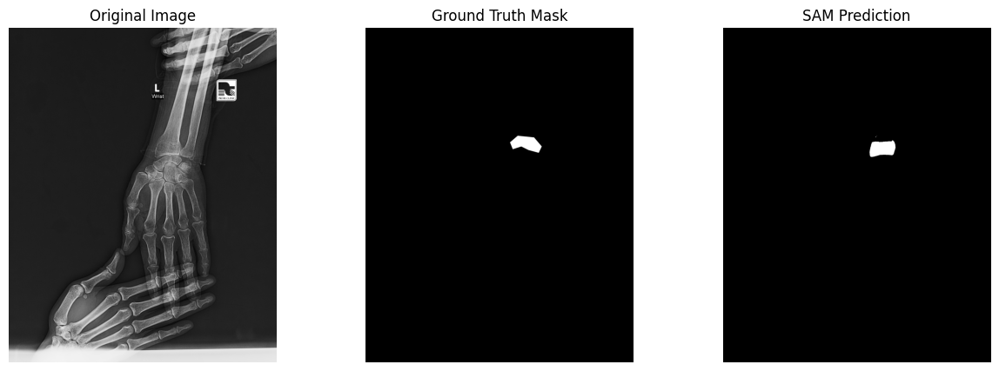

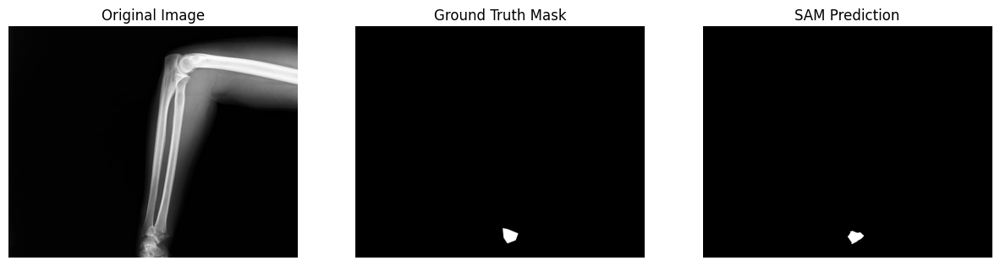

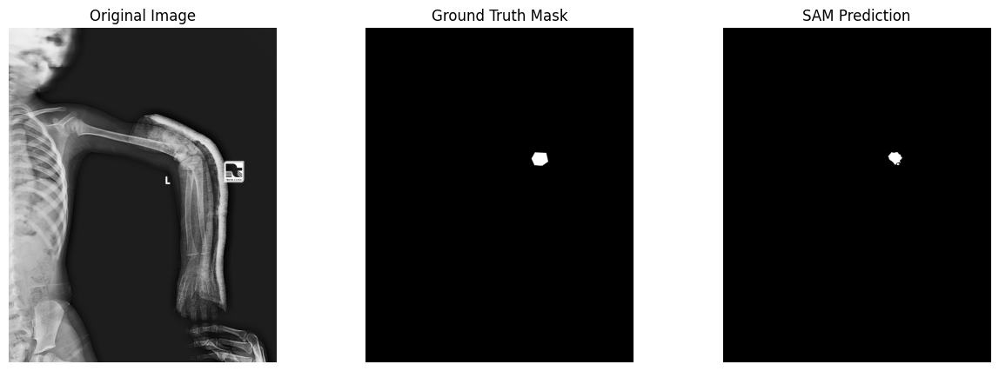

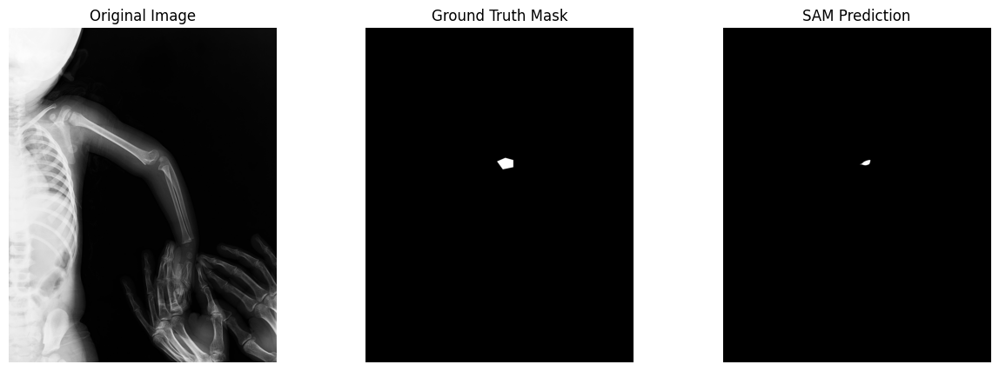

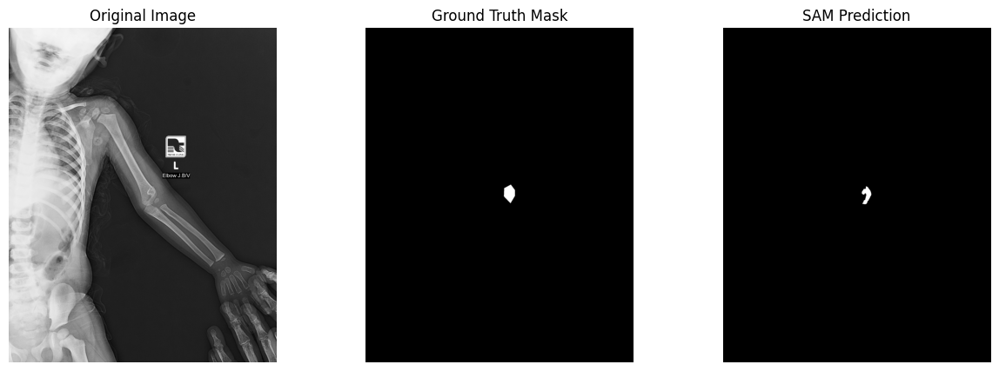

...

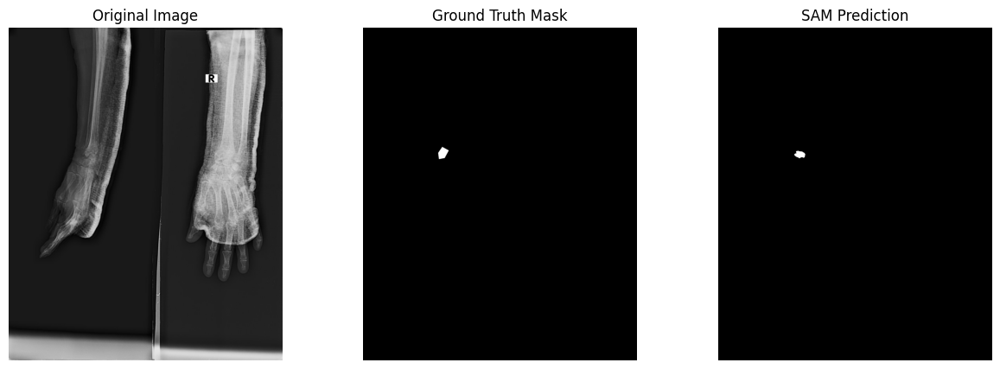

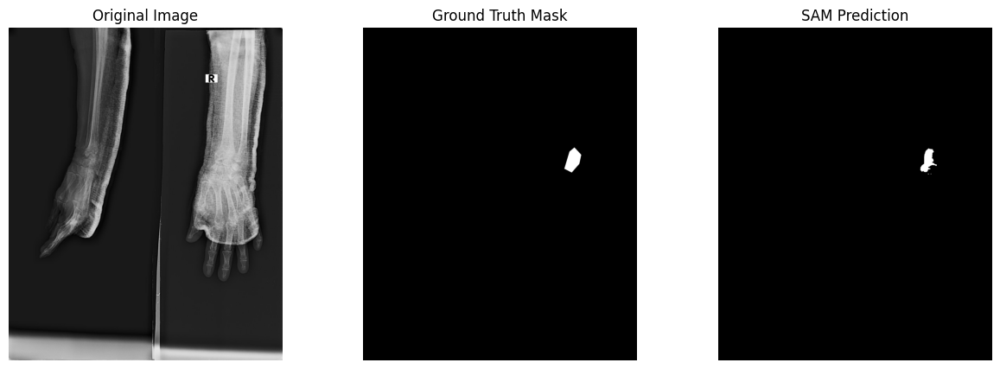

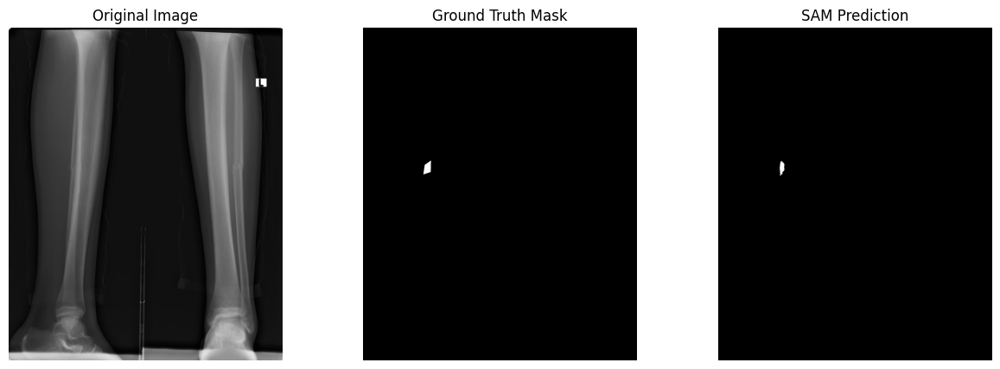

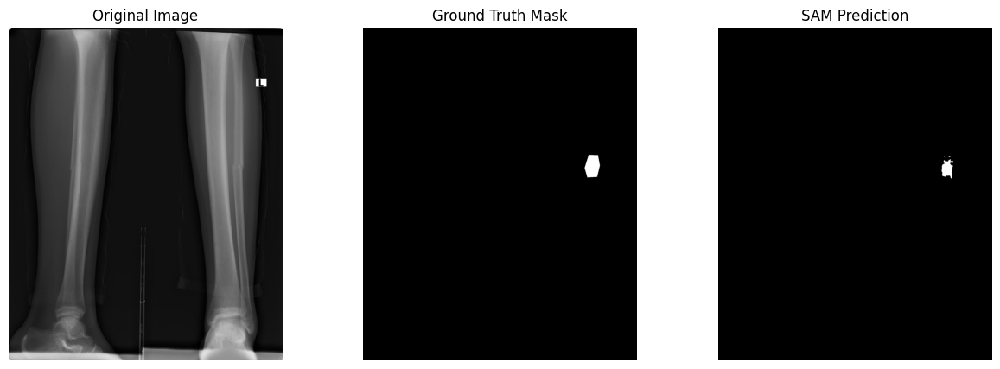

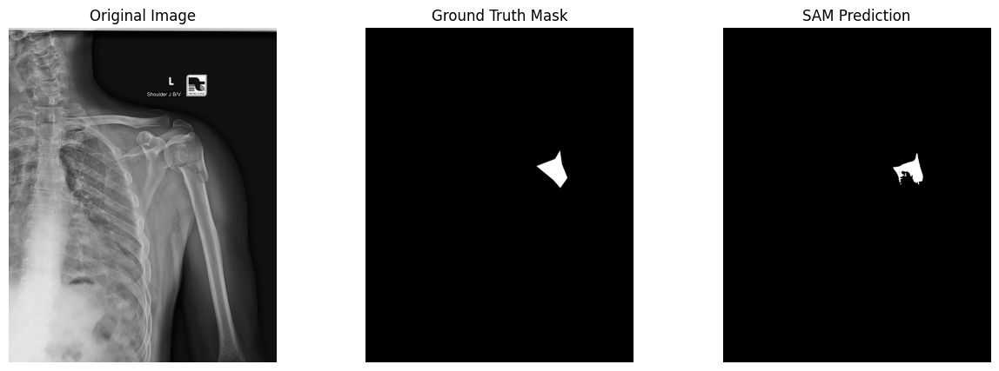

In [ ]:
# Modified code with error handling
for idx, img_id in enumerate(img_ids):
    try:
        # Load image and annotations
        img_info = coco.loadImgs(img_id)[0]
        file_name = img_info['file_name']

        # Check both fractured and non-fractured folders
        img_path_fractured = os.path.join(fractured_folder, file_name)
        img_path_non_fractured = os.path.join(non_fractured_folder, file_name)

        if os.path.exists(img_path_fractured):
            img_path = img_path_fractured
        elif os.path.exists(img_path_non_fractured):
            img_path = img_path_non_fractured
        else:
            print(f"Image not found: {file_name}")
            continue

        img_array = cv2.imread(img_path)
        if img_array is None:
            print(f"Failed to read image: {img_path}")
            continue

        image = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)

        # Rest of the processing remains the same
        ann_ids = coco.getAnnIds(imgIds=img_id)
        annotations = coco.loadAnns(ann_ids)

        predictor.set_image(image)

        for ann in annotations:
            # Convert COCO bbox to SAM format (xyxy)
            x, y, w, h = ann['bbox']
            bbox = np.array([x, y, x + w, y + h])

            # Generate mask with SAM
            masks, _, _ = predictor.predict(box=bbox, multimask_output=False)
            pred_mask = masks[0].astype(bool)

            # Get ground truth mask
            gt_mask = coco.annToMask(ann).astype(bool)

            # Calculate metrics
            iou, precision, recall = calculate_metrics(pred_mask, gt_mask)
            metrics['iou'].append(iou)
            metrics['precision'].append(precision)
            metrics['recall'].append(recall)

            # Visualize first 5 samples
            if len(metrics['iou']) > 0:
                plt.figure(figsize=(15, 5))
                plt.subplot(1, 3, 1)
                plt.imshow(image)
                plt.title("Original Image")
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(gt_mask, cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(pred_mask, cmap='gray')
                plt.title("SAM Prediction")
                plt.axis('off')

                plt.show()

    except Exception as e:
        print(f"Error processing image ID {img_id}: {str(e)}")
        continue

In [ ]:
    avg_iou = np.mean(metrics['iou'])
    avg_precision = np.mean(metrics['precision'])
    avg_recall = np.mean(metrics['recall'])

    print(f"\nEvaluation Results:")
    print(f"Average IoU: {avg_iou:.4f}")
    print(f"Average Precision: {avg_precision:.4f}")
    print(f"Average Recall: {avg_recall:.4f}")

In [35]:
import torch
import os
import json
import numpy as np
from tqdm import tqdm  # Import tqdm for progress tracking
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from pycocotools import mask as coco_mask

In [36]:
coco_json_path = root + "Annotations/COCO JSON/COCO_fracture_masks.json"
image_folder = root + "images/"
fractured_folder = os.path.join(image_folder, "Fractured")

In [37]:
def load_coco_annotations(json_path):
    with open(json_path, "r") as f:
        data = json.load(f)
    return data

annotations = load_coco_annotations(coco_json_path)

# Convert COCO polygon segmentation to binary mask
def coco_segmentation_to_mask(segmentation, img_size):
    mask = np.zeros(img_size, dtype=np.uint8)
    for seg in segmentation:
        rle = coco_mask.frPyObjects([seg], img_size[0], img_size[1])
        mask += coco_mask.decode(rle)[:, :, 0]
    return mask

In [38]:
class FractureSegmentationDataset(Dataset):
    def __init__(self, annotations, image_folder, transform=None, img_size=(256, 256)):
        self.annotations = annotations
        self.image_folder = image_folder
        self.transform = transform
        self.img_size = img_size
        self.image_id_to_filename = {img["id"]: img["file_name"] for img in annotations["images"]}
        self.masks = annotations["annotations"]

    def __len__(self):
        return len(self.masks)

    def __getitem__(self, idx):
        ann = self.masks[idx]
        image_id = ann["image_id"]
        image_path = os.path.join(self.image_folder, self.image_id_to_filename[image_id])

        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found: {image_path}")

        image = Image.open(image_path).convert("RGB")
        mask = coco_segmentation_to_mask(ann['segmentation'], self.img_size)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Add channel dimension

        if self.transform:
            image = self.transform(image)

        return image, mask

In [40]:
from torch.utils.data import Dataset, DataLoader, random_split
transform = transforms.Compose([
    transforms.Resize((1024, 1024)),  # Resize to 1024x1024
    transforms.ToTensor(),  # Convert to tensor
])

dataset = FractureSegmentationDataset(annotations, fractured_folder, transform)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=4, shuffle=False)

In [45]:
sam_checkpoint = "sam_vit_b_01ec64.pth"
torch.hub.download_url_to_file("https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth", sam_checkpoint)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint).to(device)
for param in sam.image_encoder.parameters():
    param.requires_grad = False
for param in sam.prompt_encoder.parameters():
    param.requires_grad = False

sam.to(device=device)

100%|██████████| 358M/358M [00:11<00:00, 31.3MB/s]


Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    )


In [44]:
def iou(pred, target):
    intersection = (pred & target).sum()
    union = (pred | target).sum()
    return intersection / union if union != 0 else 0

def precision_recall(pred, target):
    tp = (pred & target).sum()
    fp = (pred & ~target).sum()
    fn = (~pred & target).sum()
    precision = tp / (tp + fp) if (tp + fp) != 0 else 0
    recall = tp / (tp + fn) if (tp + fn) != 0 else 0
    return precision, recall

def evaluate_model(model, val_dataloader, loss_fn):
    model.eval()
    total_loss, total_iou, total_precision, total_recall = 0, 0, 0, 0
    with torch.no_grad():
        for images, masks in val_dataloader:
            images, masks = images.to(device), masks.to(device)
            image_embeddings = model.image_encoder(images)
            dense_pe = model.prompt_encoder.get_dense_pe()
            sparse_prompt_embeddings, dense_prompt_embeddings = model.prompt_encoder(points=None, boxes=None, masks=None)
            masks_pred, _ = model.mask_decoder(
                image_embeddings=image_embeddings,
                image_pe=dense_pe,
                sparse_prompt_embeddings=sparse_prompt_embeddings,
                dense_prompt_embeddings=dense_prompt_embeddings,
                multimask_output=False
            )
            loss = loss_fn(masks_pred, masks)
            total_loss += loss.item()
            total_iou += iou(masks_pred > 0, masks > 0)
            precision, recall = precision_recall(masks_pred > 0, masks > 0)
            total_precision += precision
            total_recall += recall
    return total_loss / len(val_dataloader), total_iou / len(val_dataloader), total_precision / len(val_dataloader), total_recall / len(val_dataloader)

In [46]:
def train_sam(train_dataloader, val_dataloader, model, epochs=10):
    model.train()
    optimizer = torch.optim.Adam(model.mask_decoder.parameters(), lr=1e-4)
    loss_fn = torch.nn.BCEWithLogitsLoss()
    accumulation_steps = 4

    for epoch in range(epochs):
        optimizer.zero_grad()
        total_loss = 0.0
        progress_bar = tqdm(enumerate(train_dataloader), total=len(train_dataloader), desc=f"Epoch {epoch+1}")
        for batch_idx, (images, masks) in progress_bar:
            images = images.to(device)
            masks = masks.to(device)

            with torch.inference_mode():
                image_embeddings = model.image_encoder(images)
                dense_pe = model.prompt_encoder.get_dense_pe()

            sparse_prompt_embeddings, dense_prompt_embeddings = model.prompt_encoder(points=None, boxes=None, masks=None)
            masks_pred, _ = model.mask_decoder(image_embeddings=image_embeddings, image_pe=dense_pe, sparse_prompt_embeddings=sparse_prompt_embeddings, dense_prompt_embeddings=dense_prompt_embeddings, multimask_output=False)

            loss = loss_fn(masks_pred, masks) / accumulation_steps
            loss.backward()
            total_loss += loss.item() * accumulation_steps

            if (batch_idx + 1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()

            progress_bar.set_postfix(loss=loss.item() * accumulation_steps)

        val_loss, val_iou, val_precision, val_recall = evaluate_model(model, val_dataloader, loss_fn)
        print(f"Epoch {epoch+1} Validation Loss: {val_loss:.4f}, IoU: {val_iou:.4f}, Precision: {val_precision:.4f}, Recall: {val_recall:.4f}")
        torch.save(model.state_dict(), f"sam_fracture_epoch{epoch+1}.pth")

train_sam(train_dataloader, val_dataloader, sam, epochs=2)


Epoch 1: 100%|██████████| 185/185 [05:56<00:00,  1.93s/it, loss=0.044]


Epoch 1 Validation Loss: 0.0371, IoU: 0.0000, Precision: 0.0000, Recall: 0.0000


Epoch 2: 100%|██████████| 185/185 [05:54<00:00,  1.92s/it, loss=0.0565]


Epoch 2 Validation Loss: 0.0339, IoU: 0.0000, Precision: 0.0000, Recall: 0.0000


# Segmentation Report:
## Dataset description:
The dataset is structured in the COCO format, with image annotations stored as JSON. Each sample consists of:
- An RGB image containing fractures.
- A binary segmentation mask derived from COCO polygon annotations.
- A predefined dataset split (80% training, 20% validation).  

## Architecture:
The model is based on the Segment Anything Model (SAM) ViT-B, which includes:
- Image Encoder (Frozen) - The image encoder processes the input image into a latent feature representation using a Vision Transformer (ViT).
- Prompt Encoder (Frozen) - Encodes sparse and dense prompts.  SAM requires prompts to generate a segmentation mask.
#### These prompts can be:
-- Points (e.g., clicking on an object in the image).
-- Boxes (bounding boxes around the object).
-- Masks (partial segmentations to refine results).
The prompt encoder converts these inputs into dense embeddings that guide the segmentation process.
- Mask Decoder (Trainable) - Predicts segmentation masks from embeddings.  
We specifically train the mask decoder while keeping the encoders frozen to utilize pretrained feature extraction.  
however for producing the visulaizations before training we chose sam-h which is the larger version of sam-b but we had to exclude it since we ran into some out of memory issues and had to continue our training process with sam base (the smaller version).

## Training:
Images were resized to 1024x1024 and Converted to tensors for PyTorch processing. but Normalization is handled implicitly by the pretrained SAM model. Adam with a learning rate of 1e-4 was chosen as the optimizer and for the loss function we used Binary Cross-Entropy with Logits Loss.

## Conclusion
from the images produced by sam h we can see that the model can already very accurately detect the fraction, it has some error on finding the exact shape of the fraction but in terms of location, it could be considered state of the art, however for demostration purposes we trained the b version for two epochs(bacause of computational limitations)
the results indicate a significant low loss value. also for sam h we got the metrics for a sample dataset:  
Mean IoU: 0.0267  
Mean Precision: 0.0272  
Mean Recall: 0.4732  